In [71]:
#tabular data imports :
import pandas as pd
import numpy as np
from pydataset import data

# visualization imports:
import matplotlib.pyplot as plt
import seaborn as sns
# Custom palette with specified colors
custom_palette = sns.color_palette(["#33B8C6", "#C64133", "#4682B4"])
# Using a matplotlib colormap
custom_palette2 = sns.color_palette(["#33B8C6","#50C2CE","#6DCCD6","#8AD6DE","#A7E0E6","#C4EAEE","#E1F4F6"])

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

# success metrics from earlier in the week: mean squared error and r^2 explained variance
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures

#stats
from scipy import stats
from scipy.stats import pearsonr, spearmanr
from scipy.stats import shapiro

import warnings
warnings.filterwarnings("ignore")
import wrangle as w
import explore as e
import model as m
import os
directory = os.getcwd()
pd.set_option('display.max_columns', None)

In [2]:
# Calling the function that combines all the steps before and creates a .csv file from the df (to run faster and locally)
df = w.prepare_wine(w.red_wine_url, w.white_wine_url)
df.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,wine_quality
wine_id,,,,,,,,,,,,,,
w-1,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,white,average
w-2,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,white,average
w-3,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,white,average


# EXPLORATION:
## UNIVARIATE

In [3]:
e.summarize(df)

--------------------------------
--------------------------------
Information on DataFrame: 
Shape of Dataframe: (6497, 14)
--------------------------------
Basic DataFrame info:
<class 'pandas.core.frame.DataFrame'>
Index: 6497 entries, w-1 to r-1599
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 

In [4]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color', 'wine_quality'],
      dtype='object')

In [5]:
cols = ['fixed_acidity','volatile_acidity','citric_acid','residual_sugar','chlorides',\
        'free_sulfur_dioxide','total_sulfur_dioxide','density','pH','sulphates',\
        'alcohol','quality','color','wine_quality']

### Q1. What is the distribution of each variable?
#### Since I'm doing at univariate exploration, I can use the original dataset.

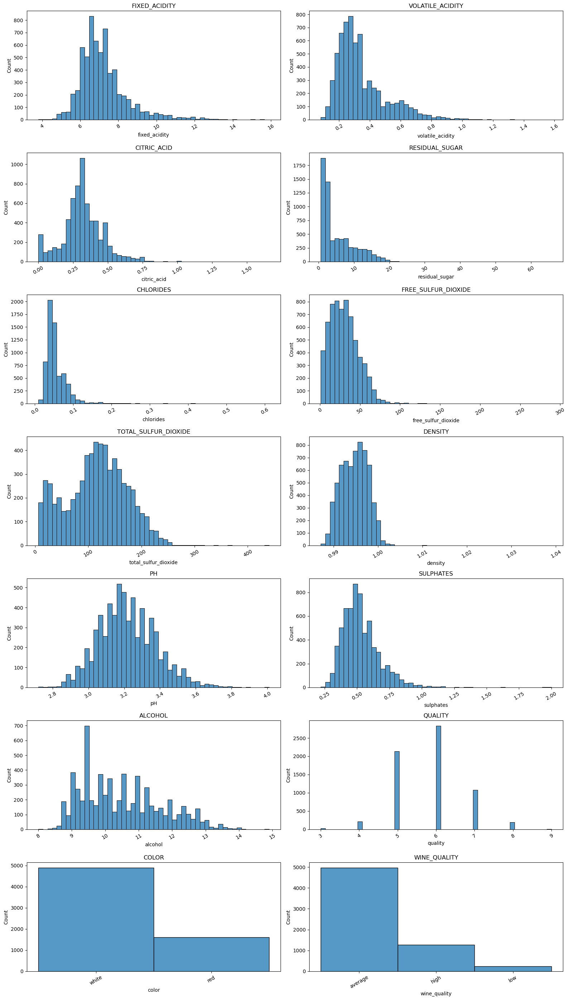

In [6]:
# Determine the number of rows needed for subplots
n_rows = len(cols) // 2 + len(cols) % 2
fig, axes = plt.subplots(n_rows, 2, figsize=(16, n_rows*4))

for i, col in enumerate(cols):
    ax = axes.flatten()[i]
    sns.histplot(df[col], bins=50, ax=ax)  # Using seaborn for a more refined look
    ax.set_title(col.upper(), fontsize=12)  # Set title for each subplot
    ax.tick_params(axis='x', rotation=30)   # Rotate x-axis labels
    ax.grid(False)  # Hide gridlines

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [7]:
# comparing the numbers of wine
pd.crosstab(df.color, df.wine_quality)

wine_quality,average,high,low
color,,,
red,1319,217,63
white,3655,1060,183


## BIVARIATE

In [8]:
# split data
train, validate, test = e.split_data(df)


    train -> (3898, 14)
    validate -> (1299, 14)
    test -> (1300, 14)


In [9]:
train.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,wine_quality
wine_id,,,,,,,,,,,,,,
w-2549,6.3,0.26,0.42,7.1,0.045,62.0,209.0,0.99544,3.20,0.53,9.5,6,white,average
w-4295,7.4,0.22,0.28,9.0,0.046,22.0,121.0,0.99468,3.10,0.55,10.8,5,white,average
r-956,8.5,0.21,0.52,1.9,0.090,9.0,23.0,0.99648,3.36,0.67,10.4,5,red,average


In [10]:
# Figuring out how many unique values each column has
for col in cols:
    unique_count = df[col].nunique()
    print(f'# of uniques in {col}: {unique_count}')

# of uniques in fixed_acidity: 106
# of uniques in volatile_acidity: 187
# of uniques in citric_acid: 89
# of uniques in residual_sugar: 316
# of uniques in chlorides: 214
# of uniques in free_sulfur_dioxide: 135
# of uniques in total_sulfur_dioxide: 276
# of uniques in density: 998
# of uniques in pH: 108
# of uniques in sulphates: 111
# of uniques in alcohol: 111
# of uniques in quality: 7
# of uniques in color: 2
# of uniques in wine_quality: 3


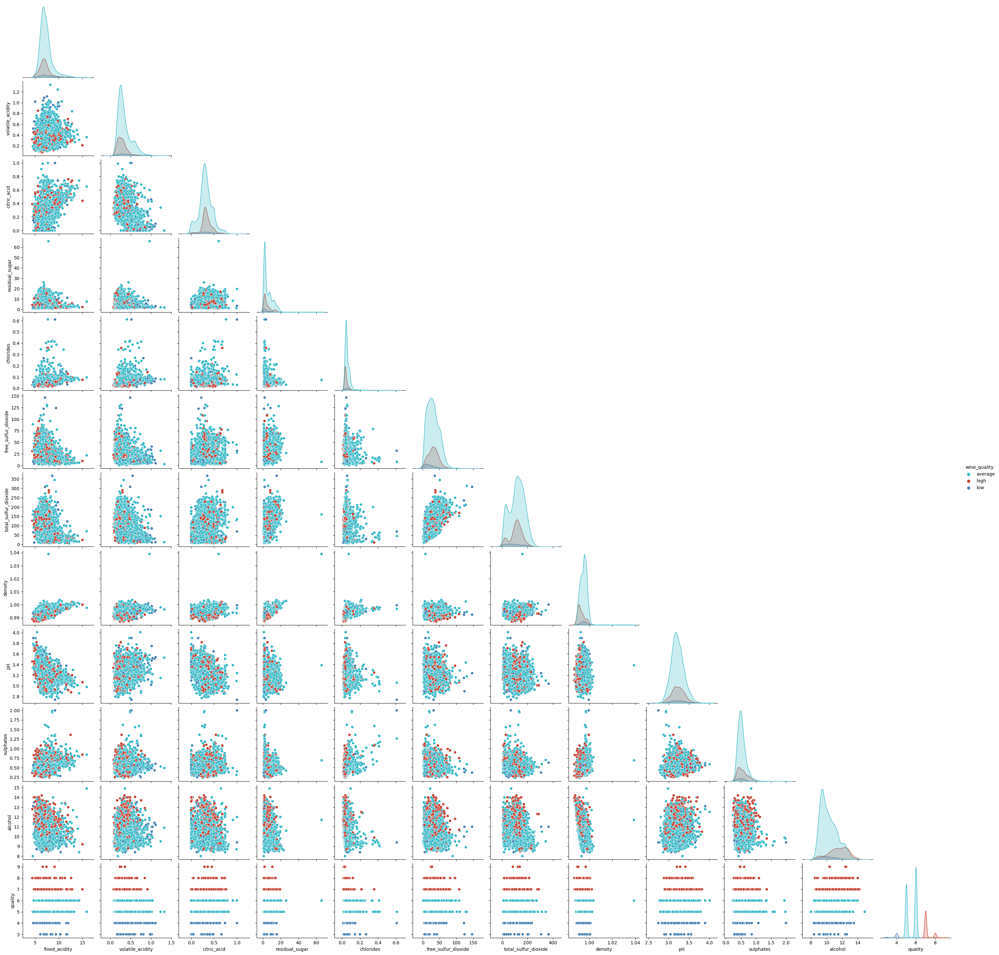

In [11]:
# pairplot with hue of quality_category
sns.pairplot(data=train, corner=True, hue='wine_quality', palette=custom_palette, plot_kws={'alpha': 1})
plt.show()

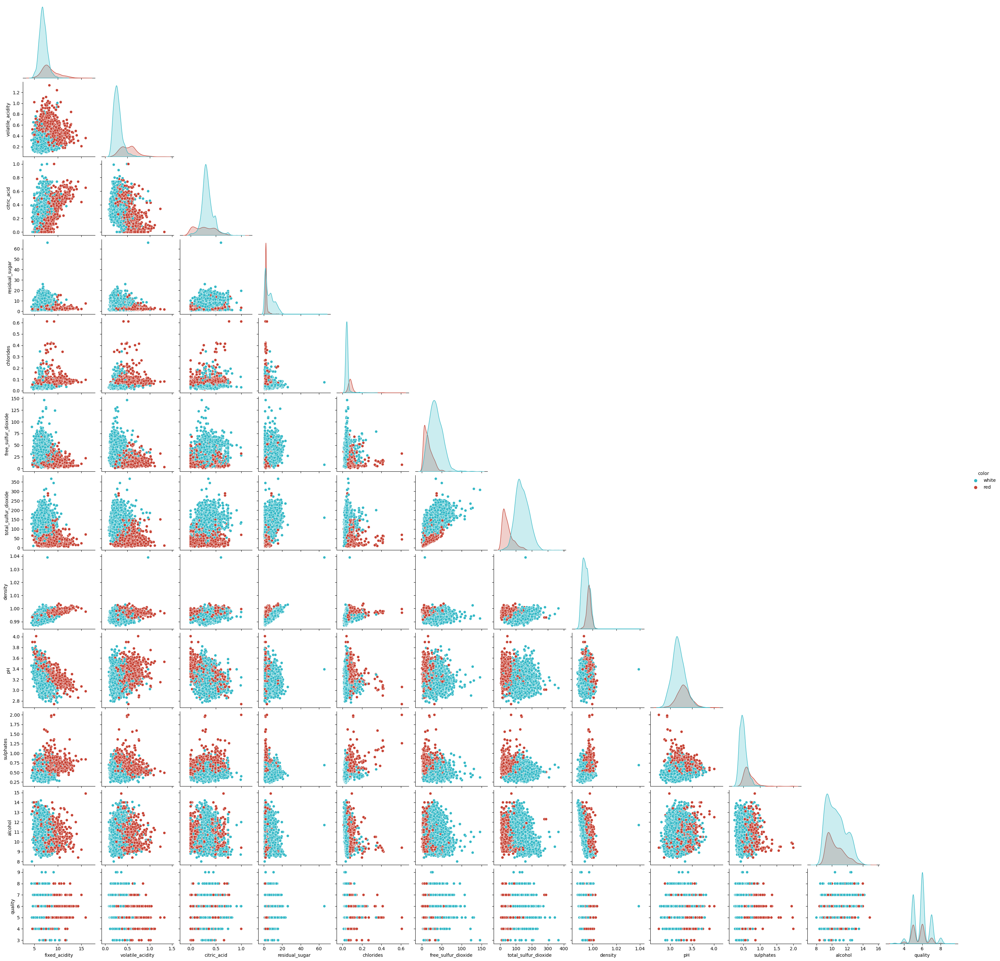

In [12]:
# pairplot with hue of color
sns.pairplot(data=train, corner=True, hue='color', palette=custom_palette)
plt.show()

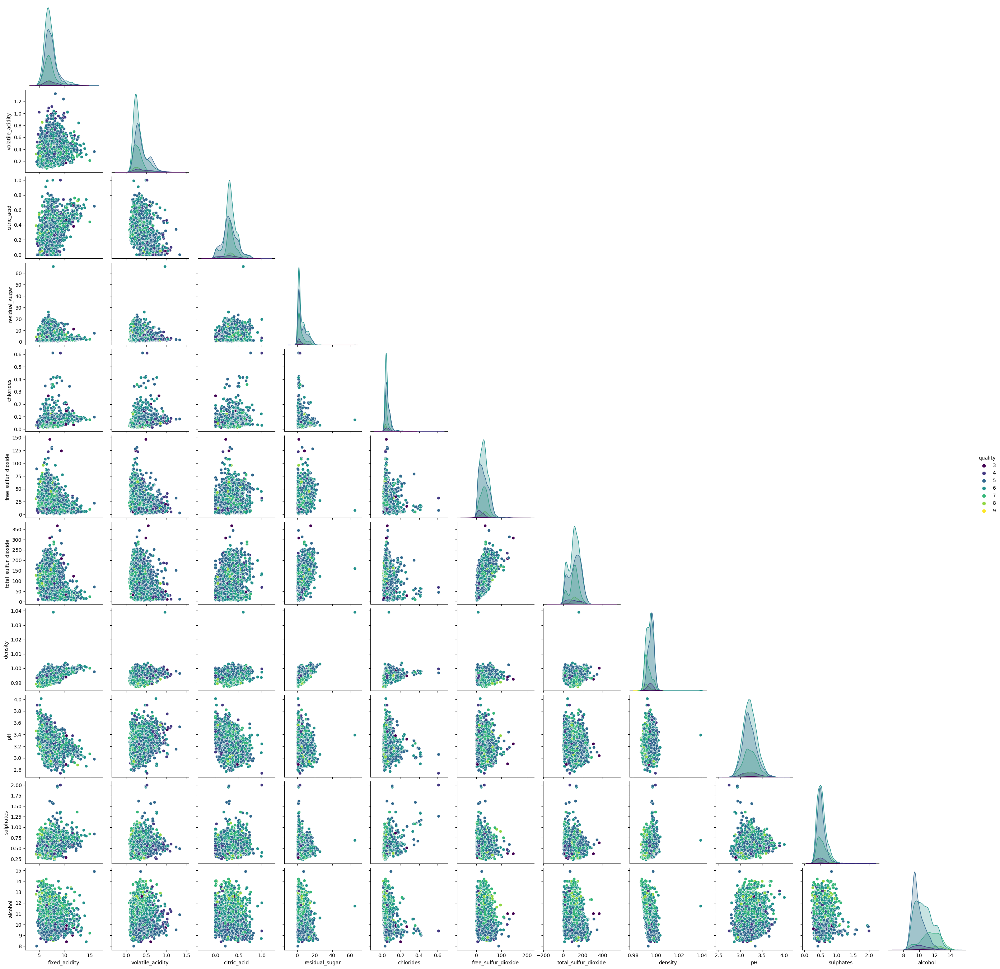

In [13]:
# pairplot with hue of quality
sns.pairplot(data=train, corner=True, hue='quality', palette='viridis')
plt.show()

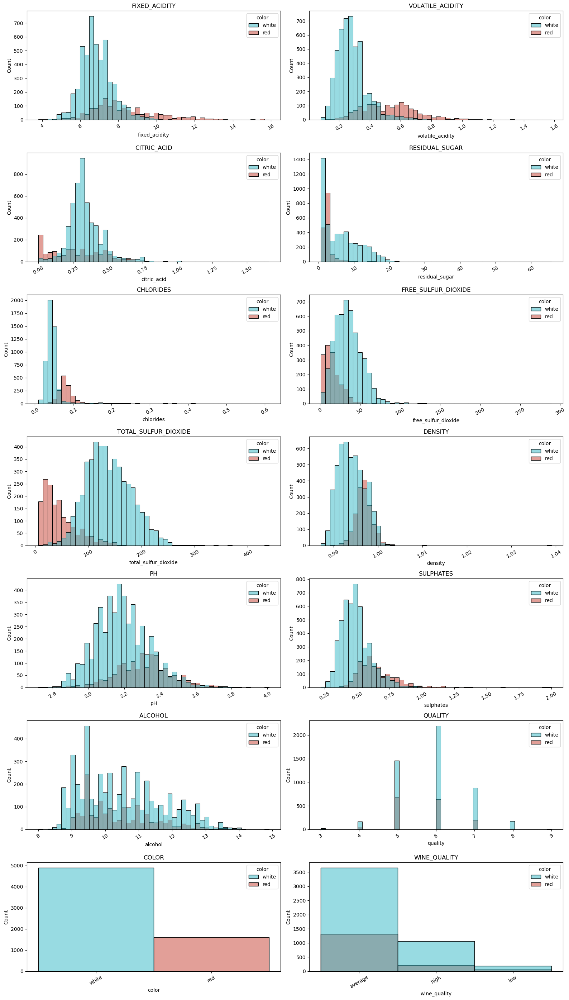

In [14]:
# Determine the number of rows needed for subplots
n_rows = len(cols) // 2 + len(cols) % 2
fig, axes = plt.subplots(n_rows, 2, figsize=(16, n_rows*4))

for i, col in enumerate(cols):
    ax = axes.flatten()[i]
    # Use seaborn for a more refined look with hue based on 'color'
    sns.histplot(df, x=col, hue='color', bins=50, ax=ax, palette=custom_palette)  # 'viridis' is an example palette, you can change it
    ax.set_title(col.upper(), fontsize=12)  # Set title for each subplot
    ax.tick_params(axis='x', rotation=30)   # Rotate x-axis labels
    ax.grid(False)  # Hide gridlines

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [15]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,wine_quality
wine_id,,,,,,,,,,,,,,
w-1,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6,white,average
w-2,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6,white,average
w-3,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6,white,average
w-4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white,average
w-5,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6,white,average


In [16]:
train_scaled, validate_scaled, test_scaled = e.preprocess_wine(df)


    train -> (3898, 16)
    validate -> (1299, 16)
    test -> (1300, 16)


In [17]:
train_scaled.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white,average,high,low
wine_id,,,,,,,,,,,,,,,,
w-2549,0.165217,0.144,0.42,0.099693,0.055092,0.419244,0.563107,0.160594,0.362205,0.169492,0.217391,0.500000,1.0,1.0,0.0,0.0
w-4295,0.260870,0.112,0.28,0.128834,0.056761,0.144330,0.319001,0.145942,0.283465,0.180791,0.405797,0.333333,1.0,1.0,0.0,0.0
r-956,0.356522,0.104,0.52,0.019939,0.130217,0.054983,0.047157,0.180644,0.488189,0.248588,0.347826,0.333333,0.0,1.0,0.0,0.0


# Explore!
- 1. Ask your question

- 2. Vizualize it

- 3. Perform a stats test, if needed

- 4. Write your takeaway



Q2. Does the pH differ across density?

In [18]:
# cluster on two features
X1 =train_scaled[['pH','density']]

In [19]:
# use the functions I created above

train_scaled, X_scaled, scaler, kmeans, centroids = e.create_cluster(train_scaled, X1, 2)

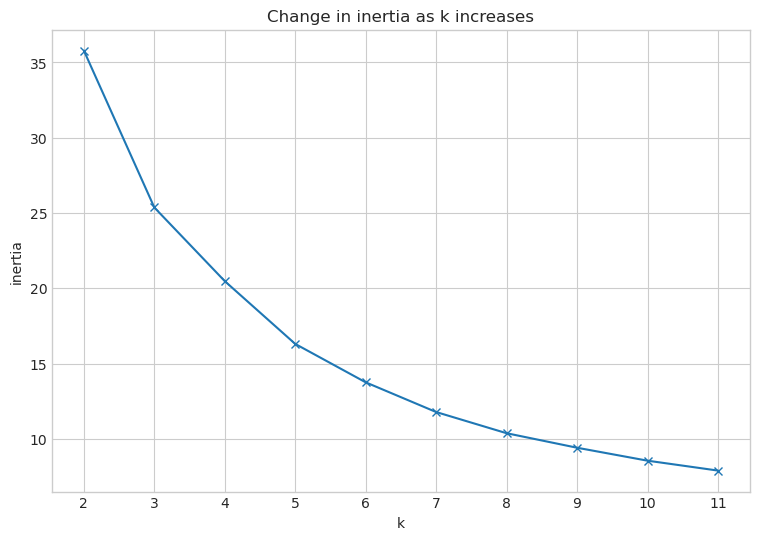

In [20]:
# explore what values of k might be appropriate

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X_scaled).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

the elbow chart above seems to suggest either '3' or '5' as the best values for k

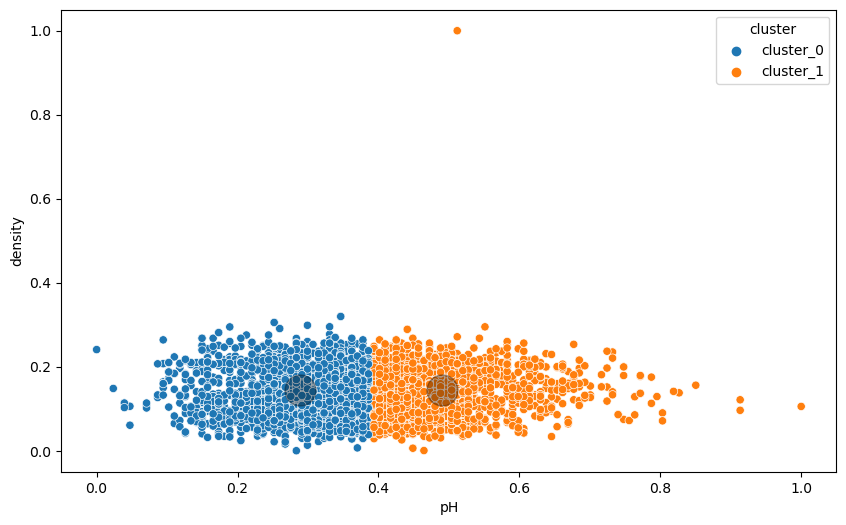

In [21]:
# use the functions I created above to plot the data

e.create_scatter_plot('pH','density',train_scaled,kmeans, X_scaled, scaler)

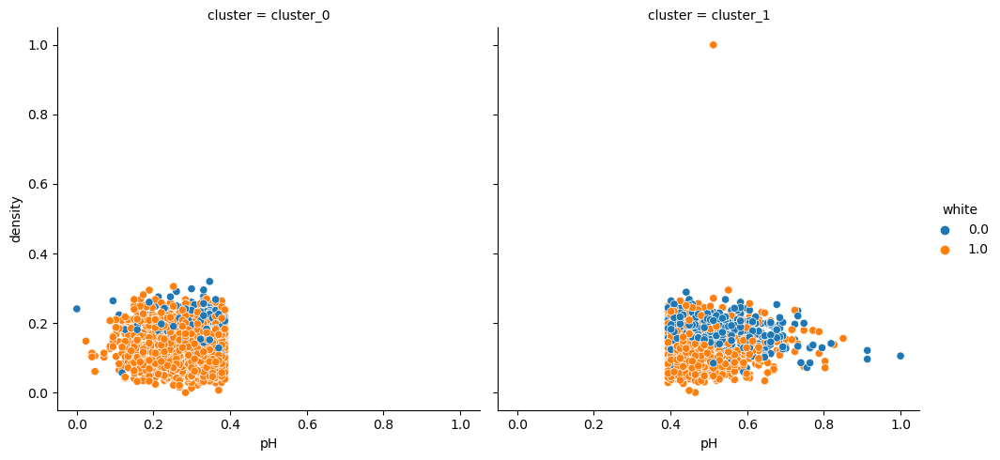

In [22]:
# lets visualize clusters by pH and density for white wine

sns.relplot(x = 'pH', y = 'density', data = train_scaled, col = 'cluster', hue = 'white')

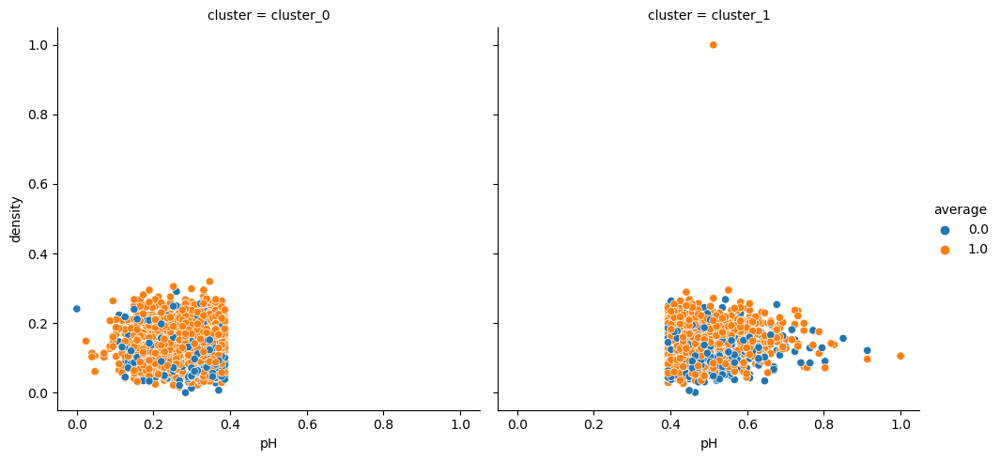

In [23]:
# lets visualize clusters by age and annual income 

sns.relplot(x = 'pH', y = 'density', data = train_scaled, col = 'cluster', hue = 'average')

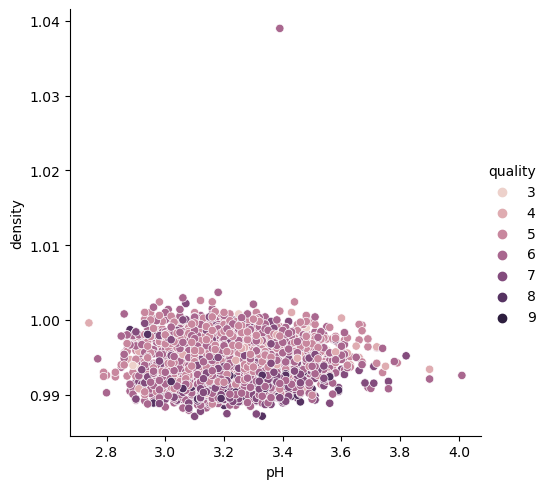

In [24]:
sns.relplot(x = 'pH', y = 'density', data = train, hue = 'quality')

### Thoughts
- more white wines have a lower pH thatn red wines
- average wine have various levels of pH and density

#### Spearman R¶
(alpha = 0.05)

- Ho: there is no linear correlation between pH and density
- Ha: there is linear correlation between pH and density

In [25]:
stats.spearmanr(train_scaled.pH, train_scaled.density)

SignificanceResult(statistic=0.008670088822849694, pvalue=0.5884079313427192)

- there is no linear correlation between pH and density
- no relation due to pvalue over alpha

In [26]:
train_scaled.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white,average,high,low,cluster
wine_id,,,,,,,,,,,,,,,,,
w-2549,0.165217,0.144,0.42,0.099693,0.055092,0.419244,0.563107,0.160594,0.362205,0.169492,0.217391,0.500000,1.0,1.0,0.0,0.0,cluster_0
w-4295,0.260870,0.112,0.28,0.128834,0.056761,0.144330,0.319001,0.145942,0.283465,0.180791,0.405797,0.333333,1.0,1.0,0.0,0.0,cluster_0
r-956,0.356522,0.104,0.52,0.019939,0.130217,0.054983,0.047157,0.180644,0.488189,0.248588,0.347826,0.333333,0.0,1.0,0.0,0.0,cluster_1


In [27]:
# cluster on two features
X2 =train_scaled[['volatile_acidity', 'alcohol']]

In [28]:
# use the functions I created above

train_scaled, X_scaled, scaler, kmeans, centroids = e.create_cluster(train_scaled, X2, 4)

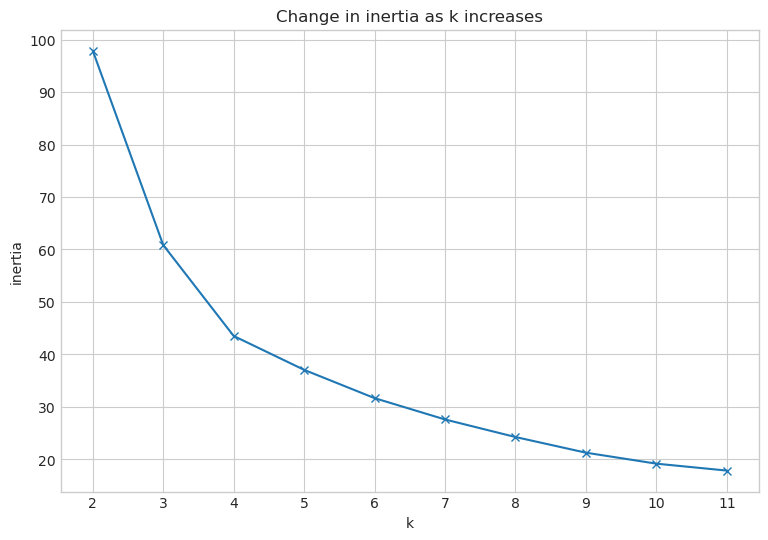

In [29]:
# explore what values of k might be appropriate

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X_scaled).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

the elbow chart above seems to suggest either '4' as the best values for k

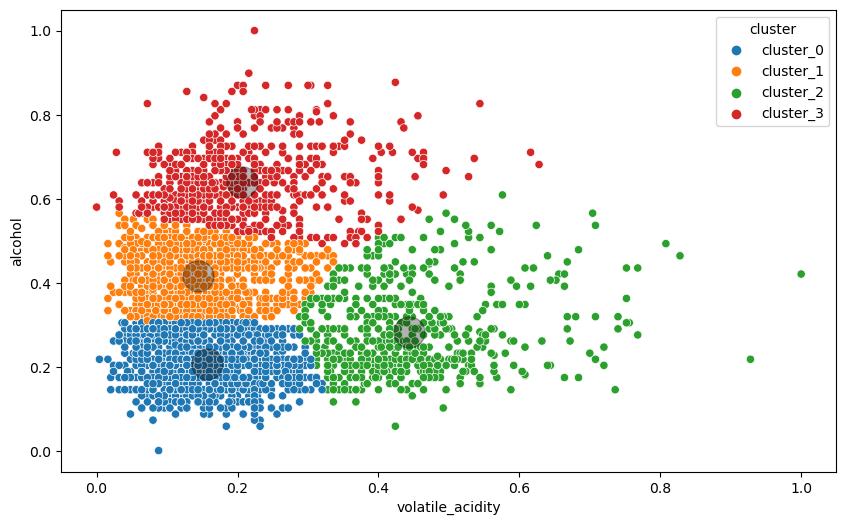

In [30]:
# use the functions I created above to plot the data

e.create_scatter_plot('volatile_acidity', 'alcohol',train_scaled,kmeans, X_scaled, scaler)

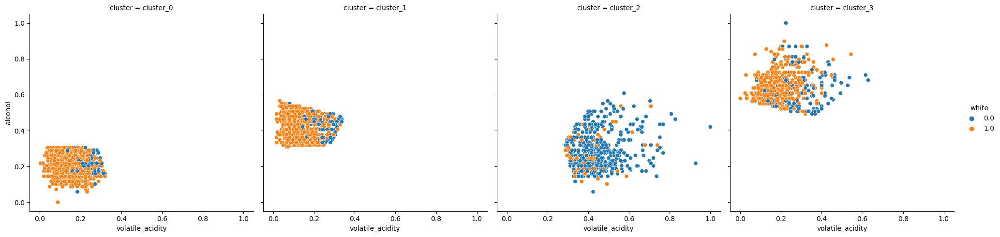

In [31]:
# lets visualize clusters by volatile acidity and alchol for white wine

sns.relplot(x = 'volatile_acidity', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'white')

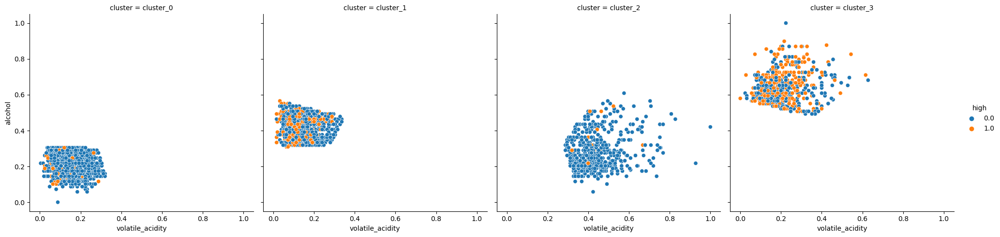

In [32]:
sns.relplot(x = 'volatile_acidity', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'high')

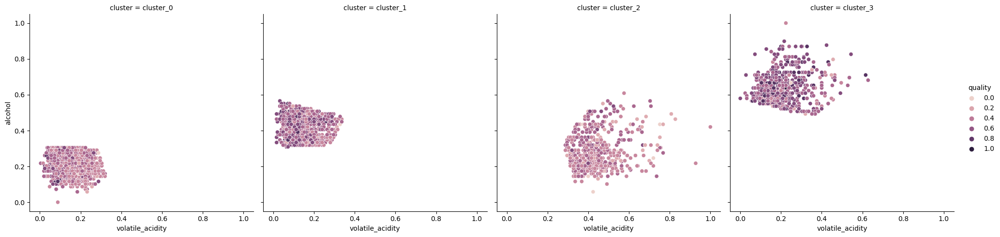

In [33]:
sns.relplot(x = 'volatile_acidity', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'quality')

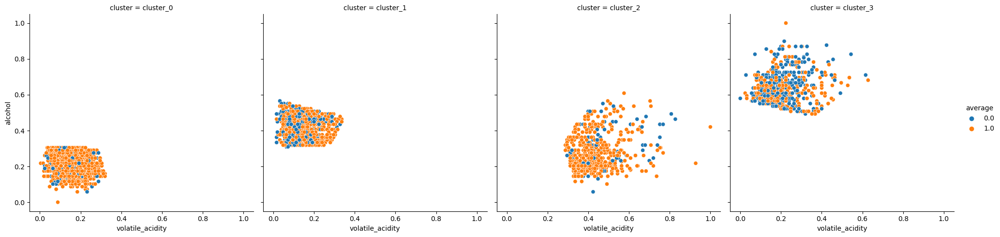

In [34]:
sns.relplot(x = 'volatile_acidity', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'average')

### Thoughts
- white wines have a lower volatile_acidity than the red wines
- average wines have average to lower alcohol levels
- higer quality wines usually have higher alcohol and somewhat low volitile acidity
- most red wines have medium to high volatile acidity

### Spearman R
(alpha = 0.05)
- Ho: there is no linear correlation between volatile_acidity and alcohol
- Ha: there is linear correlation between volatile_acidity and alcohol

In [35]:
stats.spearmanr(train_scaled.volatile_acidity, train_scaled.alcohol)

SignificanceResult(statistic=-0.015051397515591492, pvalue=0.3474893600568689)

- there is no linear correlation between volatile_acidity and alcohol
- no strong correlation

In [36]:
# cluster on two features
X3 =train_scaled[['volatile_acidity', 'free_sulfur_dioxide']]

In [37]:
# use the functions I created above

train_scaled, X_scaled, scaler, kmeans, centroids = e.create_cluster(train_scaled, X3, 3)

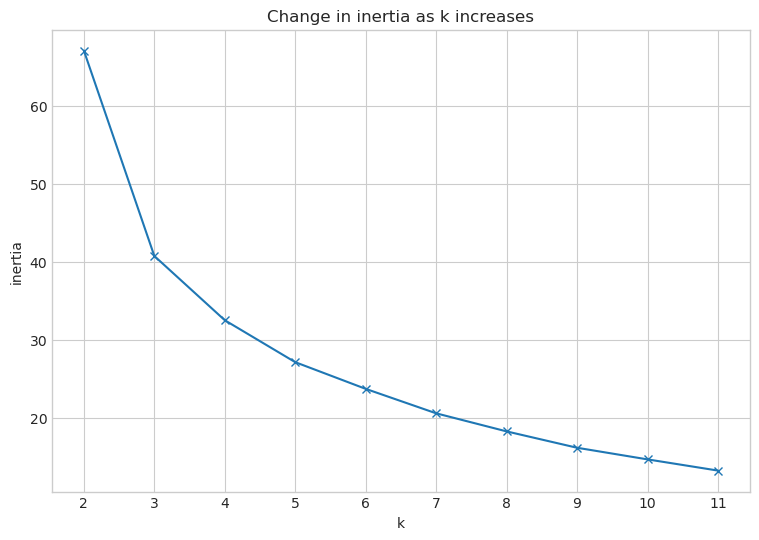

In [38]:
# explore what values of k might be appropriate

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X_scaled).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

the elbow chart above seems to suggest either '3' as the best values for k

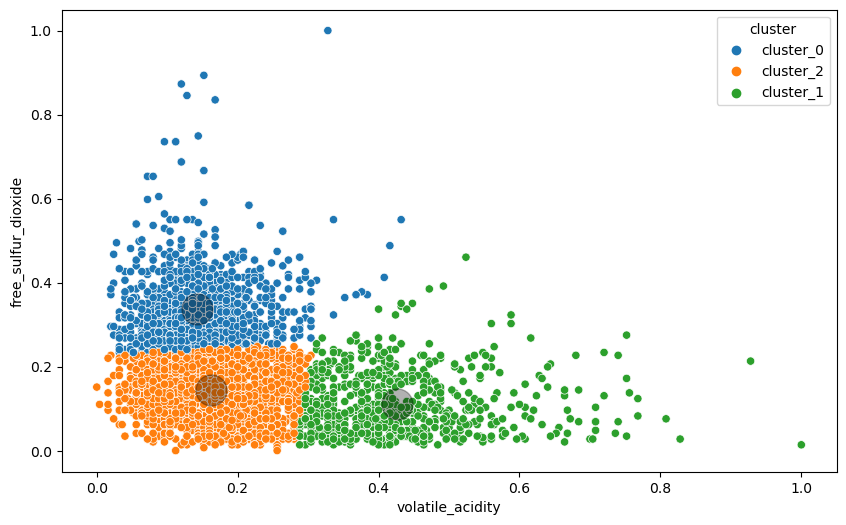

In [39]:
# use the functions I created above to plot the data

e.create_scatter_plot('volatile_acidity', 'free_sulfur_dioxide',train_scaled,kmeans, X_scaled, scaler)

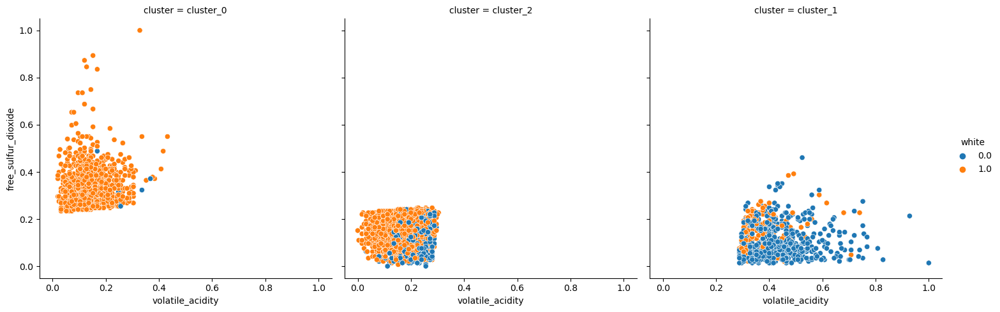

In [40]:
# lets visualize clusters by volatile acidity and free sulfur dioxide for white wine

sns.relplot(x = 'volatile_acidity', y = 'free_sulfur_dioxide', data = train_scaled, col = 'cluster', hue = 'white')

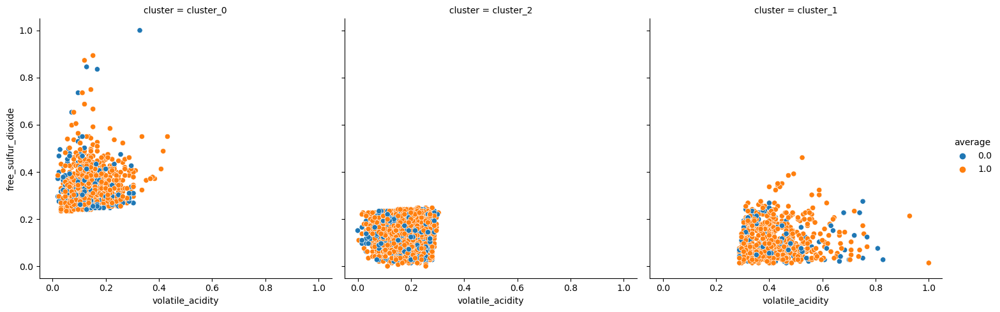

In [41]:
sns.relplot(x = 'volatile_acidity', y = 'free_sulfur_dioxide', data = train_scaled, col = 'cluster', hue = 'average')

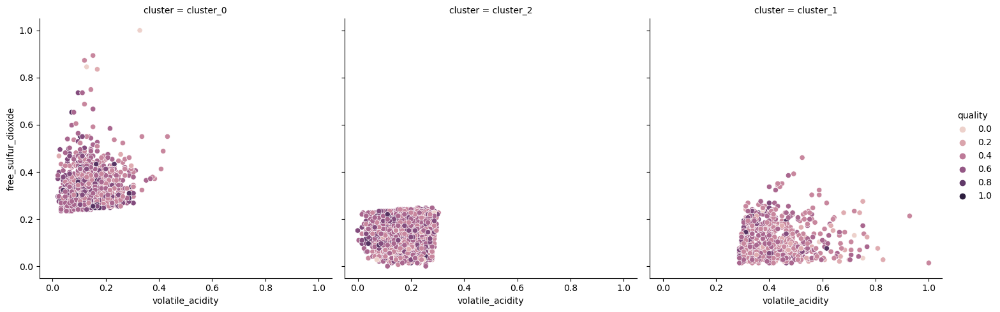

In [42]:
sns.relplot(x = 'volatile_acidity', y = 'free_sulfur_dioxide', data = train_scaled, col = 'cluster', hue = 'quality')

### Thoughts
- data with these two features is well mixed
- no apperent patterns to show

#### Spearman R¶
(alpha = 0.05)

- Ho: there is no linear correlation between volatile_acidity and free_sulfur_dioxide
- Ha: there is linear correlation between volatile_acidity and free_sulfur_dioxide

In [43]:
stats.spearmanr(train_scaled.volatile_acidity, train_scaled.free_sulfur_dioxide)

SignificanceResult(statistic=-0.3676247063655699, pvalue=5.048663672328376e-125)

- there is no linear correlation between volatile_acidity and free_sulfur_dioxide
- however, there does appear to be some kind of non-linear relationship

In [44]:
# cluster on two features
X4 =train_scaled[['citric_acid', 'total_sulfur_dioxide']]

In [45]:
# use the functions I created above

train_scaled, X_scaled, scaler, kmeans, centroids = e.create_cluster(train_scaled, X4, 5)

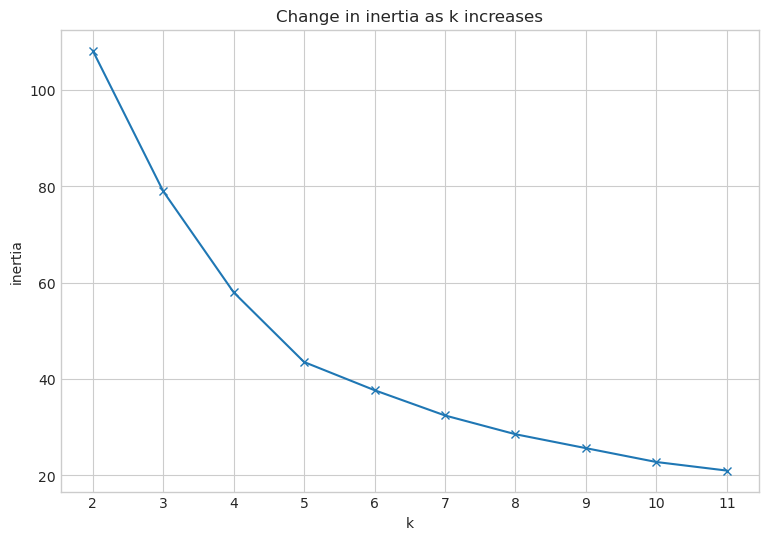

In [46]:
# explore what values of k might be appropriate

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X_scaled).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

the elbow chart above seems to suggest either '5' as the best values for k

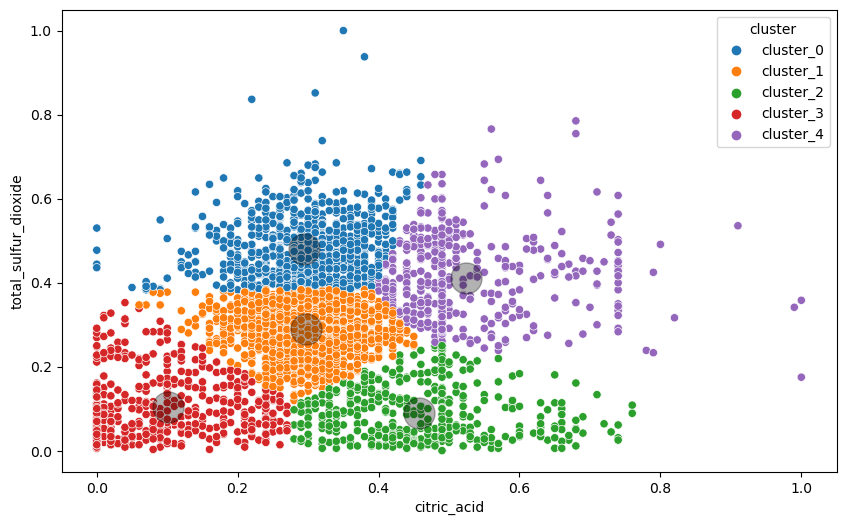

In [47]:
# use the functions I created above to plot the data

e.create_scatter_plot('citric_acid', 'total_sulfur_dioxide',train_scaled,kmeans, X_scaled, scaler)

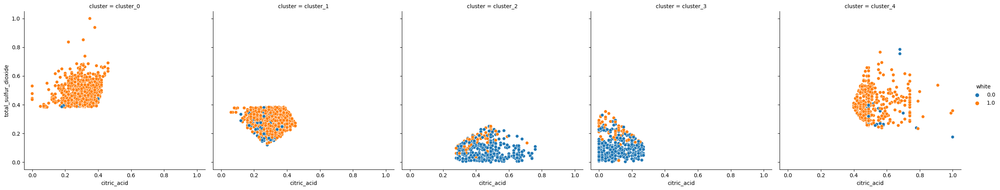

In [48]:
# lets visualize clusters by citric acid and total sulfur dioxide for white wines 

sns.relplot(x = 'citric_acid', y = 'total_sulfur_dioxide', data = train_scaled, col = 'cluster', hue = 'white')

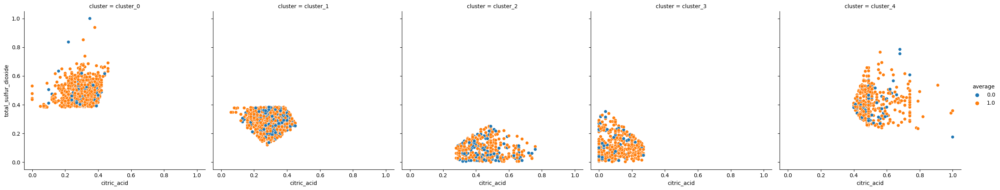

In [49]:
sns.relplot(x = 'citric_acid', y = 'total_sulfur_dioxide', data = train_scaled, col = 'cluster', hue = 'average')

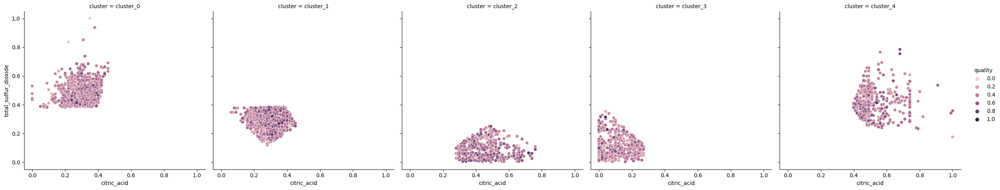

In [50]:
sns.relplot(x = 'citric_acid', y = 'total_sulfur_dioxide', data = train_scaled, col = 'cluster', hue = 'quality')

### Thoughts
- red wine has a lower total_sulfur_dioxide than white wine
- quality of wines are stattered throughout

#### Spearman R¶¶
(alpha = 0.05)

- Ho: there is no linear correlation between citric_acid and total_sulfur_dioxide
- Ha: there is linear correlation between citric_acid and total_sulfur_dioxide

In [51]:
stats.spearmanr(train_scaled.citric_acid, train_scaled.total_sulfur_dioxide)

SignificanceResult(statistic=0.16155508497040533, pvalue=3.3125688925032825e-24)

- there is no linear correlation between citric_acid and total_sulfur_dioxide
- however, there does appear to be some kind of non-linear relationship (very low)

In [52]:
train_scaled.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white,average,high,low,cluster
wine_id,,,,,,,,,,,,,,,,,
w-2549,0.165217,0.144,0.42,0.099693,0.055092,0.419244,0.563107,0.160594,0.362205,0.169492,0.217391,0.500000,1.0,1.0,0.0,0.0,cluster_0
w-4295,0.260870,0.112,0.28,0.128834,0.056761,0.144330,0.319001,0.145942,0.283465,0.180791,0.405797,0.333333,1.0,1.0,0.0,0.0,cluster_1
r-956,0.356522,0.104,0.52,0.019939,0.130217,0.054983,0.047157,0.180644,0.488189,0.248588,0.347826,0.333333,0.0,1.0,0.0,0.0,cluster_2


In [53]:
# cluster on two features
X5 =train_scaled[['chlorides', 'sulphates']]

In [54]:
# use the functions I created above

train_scaled, X_scaled, scaler, kmeans, centroids = e.create_cluster(train_scaled, X5, 5)

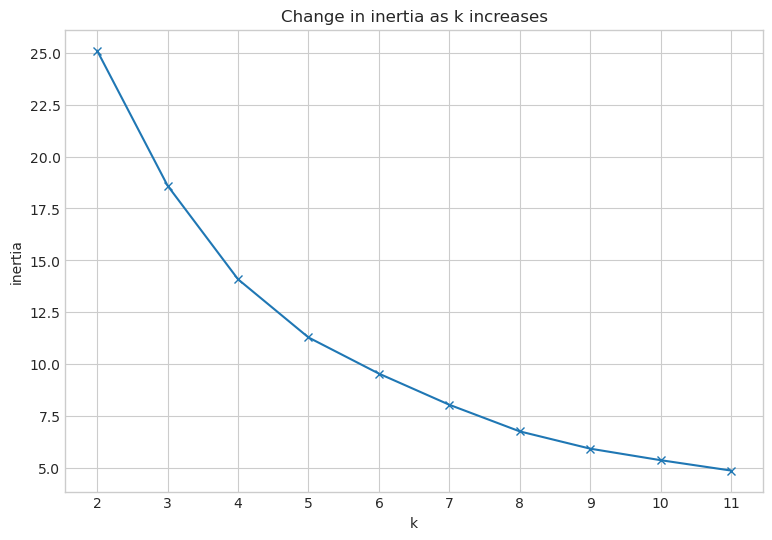

In [55]:
# explore what values of k might be appropriate

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X_scaled).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

the elbow chart above seems to suggest either '5' as the best values for k

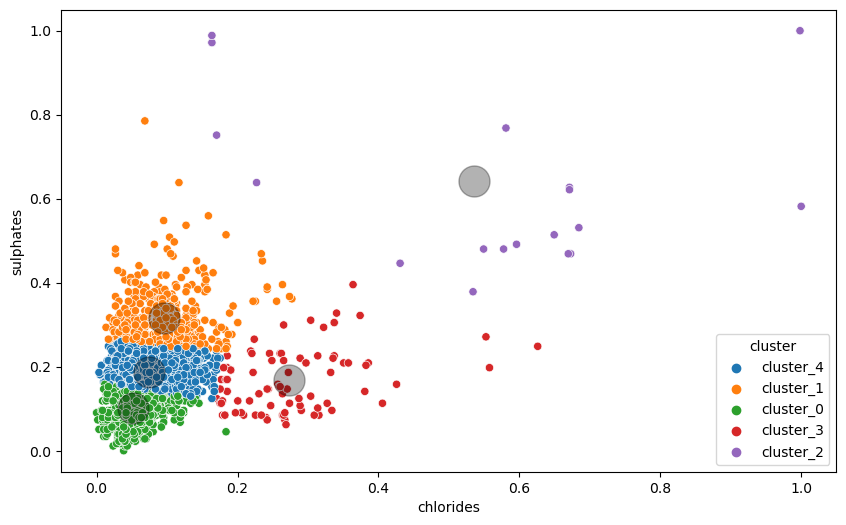

In [56]:
# use the functions I created above to plot the data

e.create_scatter_plot('chlorides','sulphates',train_scaled,kmeans, X_scaled, scaler)

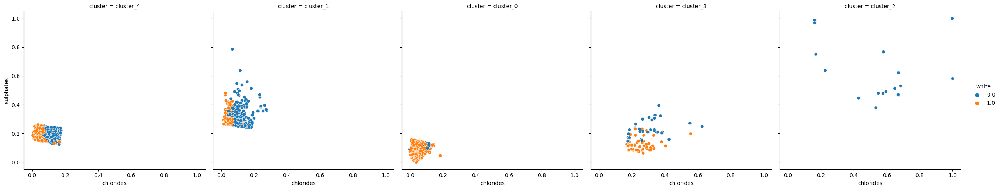

In [57]:
# lets visualize clusters by chlorides and sulphates for white wines

sns.relplot(x = 'chlorides', y = 'sulphates', data = train_scaled, col = 'cluster', hue = 'white')

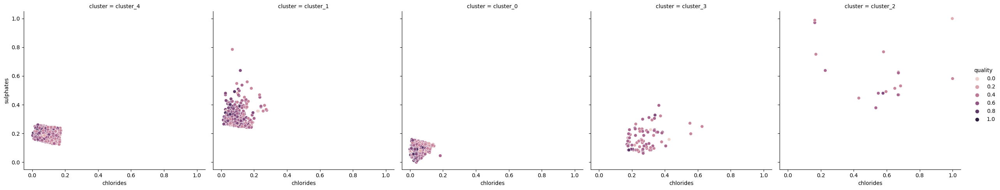

In [58]:
# lets visualize clusters by chlorides and sulphates for quality

sns.relplot(x = 'chlorides', y = 'sulphates', data = train_scaled, col = 'cluster', hue = 'quality')

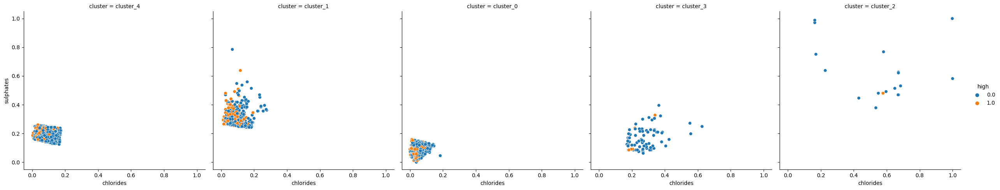

In [59]:
sns.relplot(x = 'chlorides', y = 'sulphates', data = train_scaled, col = 'cluster', hue = 'high')

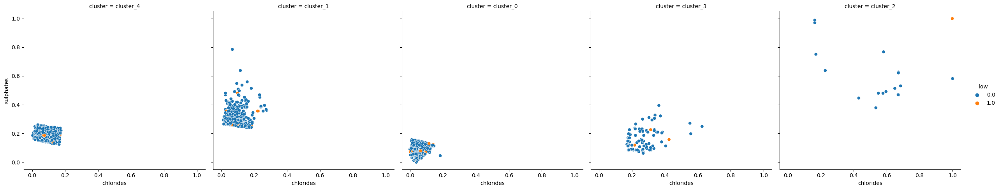

In [60]:
sns.relplot(x = 'chlorides', y = 'sulphates', data = train_scaled, col = 'cluster', hue = 'low')

### Thoughts
- the majority of high quality wines have low chlorides
- red wines tend to have higher sulphates than white wines.

#### Spearman R¶¶
(alpha = 0.05)

- Ho: there is no linear correlation between citric_acid and total_sulfur_dioxide
- Ha: there is linear correlation between citric_acid and total_sulfur_dioxide

In [61]:
stats.spearmanr(train_scaled.citric_acid, train_scaled.total_sulfur_dioxide)

SignificanceResult(statistic=0.16155508497040533, pvalue=3.3125688925032825e-24)

- there is no linear correlation between citric_acid and total_sulfur_dioxide
- however, there does appear to be some kind of non-linear relationship (very low)

In [62]:
# cluster on two features
X6 =train_scaled[['sulphates', 'alcohol']]

In [63]:
# use the functions I created above

train_scaled, X_scaled, scaler, kmeans, centroids = e.create_cluster(train_scaled, X6, 3)

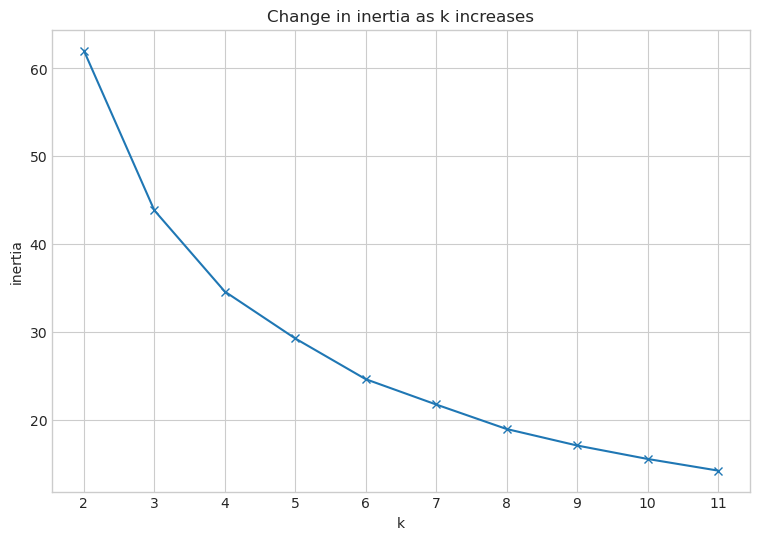

In [64]:
# explore what values of k might be appropriate

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X_scaled).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

the elbow chart above seems to suggest either '3' as the best values for k

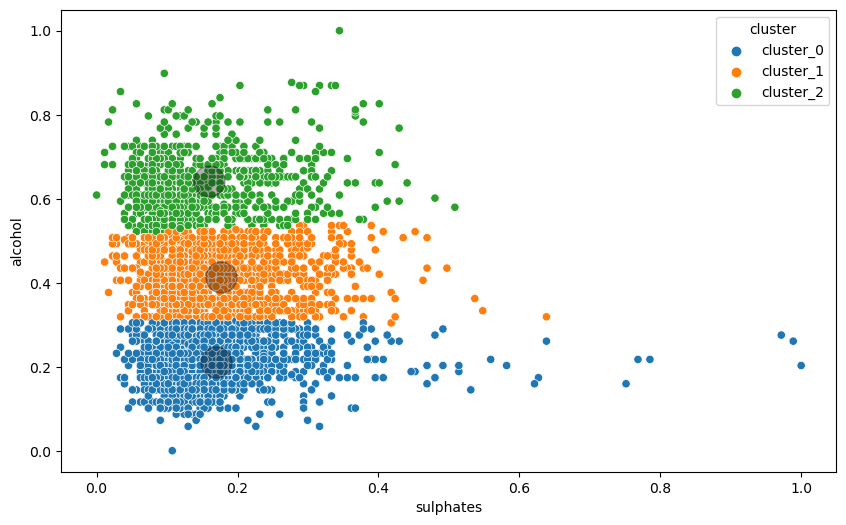

In [65]:
# use the functions I created above to plot the data

e.create_scatter_plot('sulphates','alcohol',train_scaled,kmeans, X_scaled, scaler)

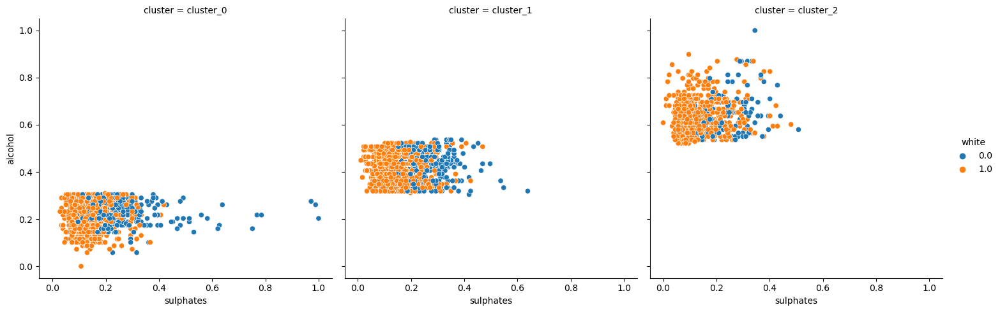

In [66]:
# lets visualize clusters by chlorides and sulphates for white wines

sns.relplot(x ='sulphates', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'white')

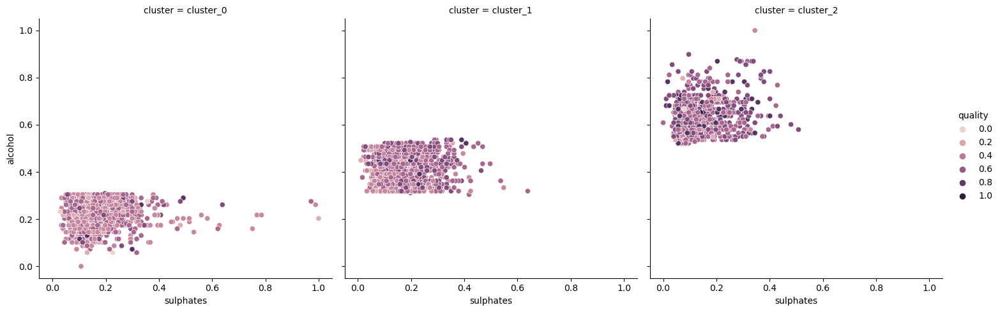

In [67]:
# lets visualize clusters by chlorides and sulphates for quality

sns.relplot(x ='sulphates', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'quality')

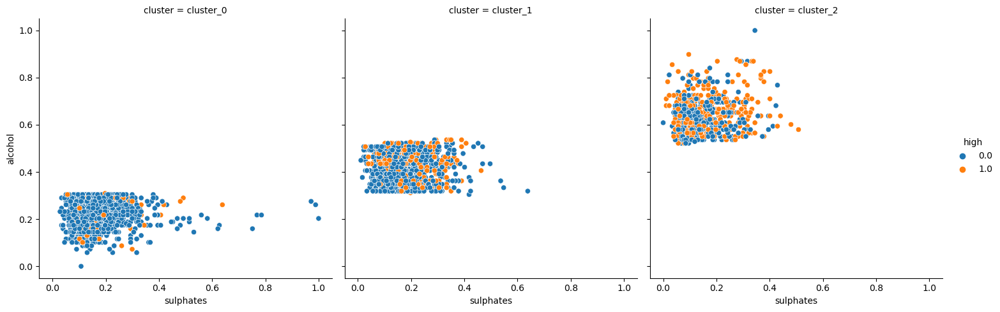

In [68]:
sns.relplot(x ='sulphates', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'high')

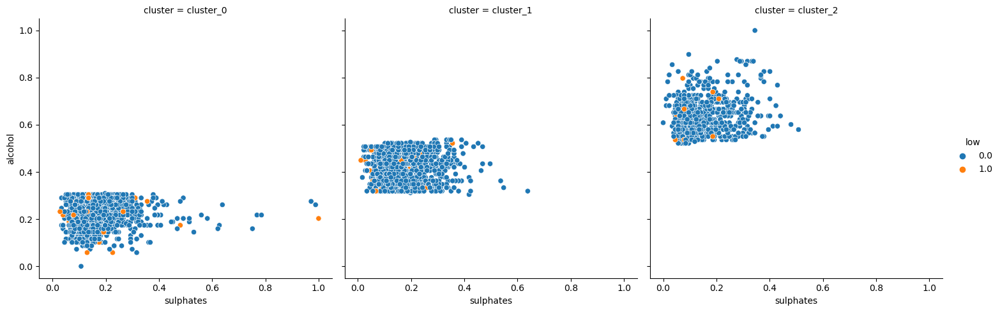

In [69]:
sns.relplot(x ='sulphates', y = 'alcohol', data = train_scaled, col = 'cluster', hue = 'low')

### Thoughts
- the majority of high quality wines have medium to high levels of alcohol

#### Spearman R¶¶
(alpha = 0.05)

- Ho: there is no linear correlation between alcohol and sulphates
- Ha: there is linear correlation between alcohol and sulphates

In [70]:
stats.spearmanr(train_scaled.alcohol, train_scaled.sulphates)

SignificanceResult(statistic=-0.0030889677653290477, pvalue=0.8471194318977447)

- there is no linear correlation between alcohol and sulphates
- no correlation